# 3. Extract rock type

This notebook extracts the fractional makeup of rock types (igneous, sedimentary, metamorphic) present in the catchment area of each debris flow location.

Potential improvement: restrict to area with a slope of 23$^\circ$ or more.  This needs a new catchment area.

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('dark_background')

Load a few columns from the sites file which contains the catchment geometry (computed using `extract_contributing_region.ipynb`).
Only keep one row per site, and set `SiteID` column as index:

In [2]:
#pqfile= "staley16_observations_catchment_fuelpars_v3.parquet"
pgfile ="../../data/staley16_sites_catchment_fuelpars_v3.parquet"
modelIF=gpd.read_parquet(pgfile).set_crs('epsg:4326')

In [3]:
modelIF=modelIF[["newarea","geometry","snapdist"]]
display(modelIF.shape)
modelIF.head(n=2)

(716, 3)

,newarea,geometry,snapdist
SiteID,,,
0,0.335633,"POLYGON ((-118.43109 34.54266, -118.43099 34.5...",7.152116
1,0.958824,"POLYGON ((-118.44860 34.55066, -118.44849 34.5...",5.874103


Geological map needs to be retrieved for every state.  First get a list of states, then download and unpack the map for each state:

In [4]:
states=gpd.read_parquet("../../data/staley16_debrisflow.parquet")["state"].drop_duplicates().to_list()
states

['CA', 'ID', 'NM', 'CO', 'MT', 'AZ', 'UT']

In [5]:
odir = "../../data/geological_map"
from os.path import isfile, isdir
from posix import mkdir 

if not isdir(odir):
    mkdir(odir)

for state in states:
    url="https://mrdata.usgs.gov/geology/state/shp/" + state + ".zip"
    ofile=odir + "/" + state + ".zip"
    print(url)
    if not isfile(ofile):
        !curl -o $ofile $url 
        !unzip -d $odir $ofile

https://mrdata.usgs.gov/geology/state/shp/CA.zip
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 23.8M  100 23.8M    0     0  20.5M      0  0:00:01  0:00:01 --:--:-- 20.5M
Archive:  ../../data/geological_map/CA.zip
  inflating: ../../data/geological_map/CA_geol_poly.dbf  
  inflating: ../../data/geological_map/CA_geol_poly.prj  
  inflating: ../../data/geological_map/CA_geol_poly.shp  
  inflating: ../../data/geological_map/CA_geol_poly.shx  
  inflating: ../../data/geological_map/CA_lith.csv  
  inflating: ../../data/geological_map/CA_ref.csv  
  inflating: ../../data/geological_map/CA_structure.dbf  
  inflating: ../../data/geological_map/CA_structure.prj  
  inflating: ../../data/geological_map/CA_structure.shp  
  inflating: ../../data/geological_map/CA_structure.shx  
  inflating: ../../data/geological_map/CA_units.csv  
https://mrdata.usgs.gov/geology/state/shp/ID.zip

Load the geological map of each state and concatenate into a single GeoPandas dataframe:

In [6]:
geols=[gpd.read_file(odir + "/" + state + "_geol_poly.shp") for state in states]

In [7]:
geol=gpd.GeoDataFrame(pd.concat(geols, ignore_index=True), crs='epsg:4326')

In [8]:
geol["GENERALIZE"].unique()

array(['Metamorphic, carbonate', 'Sedimentary, carbonate',
       'Sedimentary, undifferentiated',
       'Igneous and Sedimentary, undifferentiated',
       'Metamorphic and Sedimentary, undifferentiated',
       'Sedimentary, chemical', 'Metamorphic, undifferentiated',
       'Sedimentary, clastic', 'Igneous, intrusive',
       'Igneous and Metamorphic, undifferentiated',
       'Metamorphic, sedimentary clastic', 'Igneous, volcanic', 'Melange',
       'Metamorphic, schist', 'Metamorphic, volcanic',
       'Unconsolidated, undifferentiated', 'Metamorphic, gneiss',
       'Metamorphic, other', 'Metamorphic, amphibolite',
       'Metamorphic, serpentinite', 'Water', 'Dam',
       'Unconsolidated and Sedimentary, undifferentiated',
       'Metamorphic, intrusive', 'Sedimentary, evaporite',
       'Metamorphic, igneous', 'Tectonite, undifferentiated',
       'Igneous, undifferentiated', 'Metamorphic, sedimentary'],
      dtype=object)

Simplify geology labels, keeping only part before comma:

In [9]:
def simplify_geol(gen):
    #if gen.lower().find("and") >= 0:
    if gen == "Water":
        return gen
    else:
        return gen.split(",")[0]
    
geol["rocktype"] = geol["GENERALIZE"].apply(simplify_geol)

In [10]:
geol["rocktype"].unique()

array(['Metamorphic', 'Sedimentary', 'Igneous and Sedimentary',
       'Metamorphic and Sedimentary', 'Igneous',
       'Igneous and Metamorphic', 'Melange', 'Unconsolidated', 'Water',
       'Dam', 'Unconsolidated and Sedimentary', 'Tectonite'], dtype=object)

In [11]:
print(geol["geometry"].iat[0])

POLYGON ((-116.7204876549258 34.17209527798551, -116.72189374898826 34.17116436594364, -116.72502921733576 34.17077667823538, -116.72724505022718 34.171332950687066, -116.72731055351795 34.17190523220813, -116.7273848018432 34.17255472014649, -116.72609238328043 34.17527005205097, -116.72595679498623 34.178266137968265, -116.72473889340023 34.17805807208947, -116.72421643571644 34.17796920380886, -116.72405626912983 34.17780576765186, -116.72137632286278 34.175073918486035, -116.7207704939788 34.174455189389285, -116.7204876549258 34.17209527798551))


Carry out a spatial join between geological map and catchment areas. The resulting dataframe has one row for every match between catchment area and geological units; sometimes more than one per catchment.

In [12]:
mrg=modelIF.sjoin(geol, how="left", predicate='intersects')
mrg.head(n=2)

,newarea,geometry,snapdist,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,REF_ID,GENERALIZE,SRC_URL,URL,rocktype
SiteID,,,,,,,,,,,,,
0,0.335633,"POLYGON ((-118.43109 34.54266, -118.43099 34.5...",7.152116,7533,CA,sch,sch2;0,CAsch2;0,CA294,"Metamorphic, schist",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://mrdata.usgs.gov/geology/state/sgmc-uni...,Metamorphic
1,0.958824,"POLYGON ((-118.44860 34.55066, -118.44849 34.5...",5.874103,7533,CA,sch,sch2;0,CAsch2;0,CA294,"Metamorphic, schist",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://mrdata.usgs.gov/geology/state/sgmc-uni...,Metamorphic


In [13]:
mrg.loc[9,:]

,newarea,geometry,snapdist,index_right,STATE,ORIG_LABEL,SGMC_LABEL,UNIT_LINK,REF_ID,GENERALIZE,SRC_URL,URL,rocktype
SiteID,,,,,,,,,,,,,
9,14.272698,"POLYGON ((-118.40680 34.58172, -118.40670 34.5...",8.898839,7533,CA,sch,sch2;0,CAsch2;0,CA294,"Metamorphic, schist",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://mrdata.usgs.gov/geology/state/sgmc-uni...,Metamorphic
9,14.272698,"POLYGON ((-118.40680 34.58172, -118.40670 34.5...",8.898839,9658,CA,water,water;0,CAwater;0,CA294,Water,ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://mrdata.usgs.gov/geology/state/sgmc-uni...,Water
9,14.272698,"POLYGON ((-118.40680 34.58172, -118.40670 34.5...",8.898839,4185,CA,Ep,PN1;0,CAPN1;0,CA294,"Sedimentary, clastic",ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...,https://mrdata.usgs.gov/geology/state/sgmc-uni...,Sedimentary


In [14]:
geol.loc[7533,:]

STATE                                                        CA
ORIG_LABEL                                                  sch
SGMC_LABEL                                               sch2;0
UNIT_LINK                                              CAsch2;0
REF_ID                                                    CA294
GENERALIZE                                  Metamorphic, schist
SRC_URL       ftp://ftp.consrv.ca.gov/pub/dmg/rgmp/Published...
URL           https://mrdata.usgs.gov/geology/state/sgmc-uni...
geometry      POLYGON ((-118.36958096869989 34.5819725338708...
rocktype                                            Metamorphic
Name: 7533, dtype: object

In [15]:
import plotly.express as px
import plotly
plotly.io.templates.default = 'plotly_dark'

Plotting up one of the catchment aras (for Site 9) and the geological units that make it up:

In [16]:
idxc=[9]

mif=modelIF.loc[idxc,:].set_crs('epsg:4326')
mif["Site"] = mif.index.astype(str)

center={"lon": mif["geometry"].iat[0].centroid.x,
        "lat": mif["geometry"].iat[0].centroid.y}

fig1=px.choropleth_mapbox(mif,mif["geometry"],
                     locations=idxc,
                     zoom=12,
                     center=center,
                     color="Site",
                     color_discrete_map={'9': 'green'},
                     height=500,
                     opacity=0.5,
                     mapbox_style="stamen-terrain")

idx = mrg.loc[idxc,"index_right"].to_list()
gidx=geol.loc[idx,:].to_crs('epsg:4326')
fig2=px.choropleth_mapbox(gidx, gidx["geometry"],
                     locations=idx,
                     color=gidx["GENERALIZE"],
                     opacity=0.5)
                          
fig1.add_traces(fig2.data)

fig1

Counting the number of units present within each catchment area:

In [17]:
rtypes_by_site=mrg.groupby("SiteID").agg({"rocktype": "count"})
rtypes_by_site.head()

,rocktype
SiteID,
0,1
1,1
2,3
3,1
4,1


array([[<Axes: title={'center': 'rocktype'}>]], dtype=object)

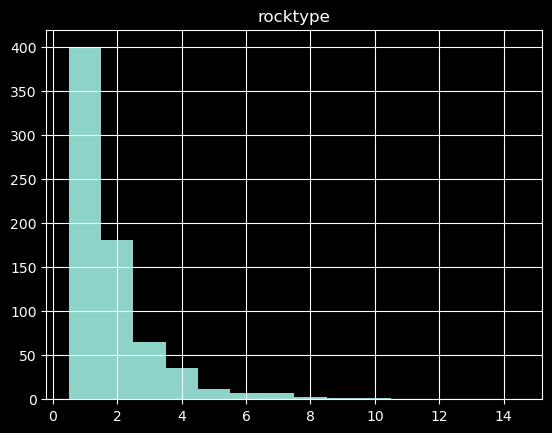

In [18]:
rtypes_by_site.hist(bins=np.arange(0.5,15.5,1))

Most sites have just one rock type, very few more than 5.

The function below computes the percentage of overlap of the catchment with each geological unit.

In [19]:
catch=modelIF.loc[9,"geometry"]
unit=geol.loc[7533,"geometry"]

In [20]:
#return amount that polygon p2 occupies of the area of polygon p1 as fraction
def getpcentoverlap(p1, p2):
    return p1.intersection(p2).area/p1.area

getpcentoverlap(catch, unit)

0.9626666400719063

The spatial join returns the geometry of the left dataframe, not the overlapping area.  
Re-joining with geology dataframe to have both catchment and geological unit in the same dataframe, and applying function to get percentual contribution of each geological unit to catchment:

In [21]:
mrg2=mrg.reset_index().merge(geol["geometry"], left_on="index_right", right_index=True, 
               suffixes=["_c","_g"], how="inner")
print(len(mrg2))

1335


In [22]:
mrg2["Frac"]=mrg2[["geometry_c","geometry_g"]].apply(lambda x: getpcentoverlap(x[0], x[1]), axis=1)

Querying result for Site 9:

In [23]:
mrg2.query("SiteID == 9")[["rocktype","Frac"]]

,rocktype,Frac
11,Metamorphic,0.962667
12,Water,0.003291
13,Sedimentary,0.034042


In [24]:
len(mrg), len(mrg2)

(1335, 1335)

Because similar rock types (e.g., 'metamorphic, sedimentary' and 'metamorphic, igneous') were merged into a simple (e.g., 'metamorphic') rock type, there are duplicate entries by site and rock type in the `mrg2` dataframe.
These need to be aggregated such that only one SiteID, rocktype pair exists in the table.  Saving the result to `rtfrag`:

In [25]:
rtfrac=mrg2[["SiteID","rocktype","Frac"]].groupby(["SiteID","rocktype"]).agg({"Frac": sum})
rtfrac.head(n=12).tail()

,,Frac
SiteID,rocktype,
5,Metamorphic,1.000000
6,Metamorphic,1.000000
7,Metamorphic,1.000000
8,Metamorphic,1.000000
9,Metamorphic,0.962667


Now unstack to create one column per rock type:

In [26]:
rttable=rtfrac.unstack(level=1).fillna(value=0)
rttable.columns=[a[1] for a in rttable.columns]
rttable.head()

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
0,0.0,0.0,0.0,1.000000,0.0,0.000000,0.0,0.000000
1,0.0,0.0,0.0,1.000000,0.0,0.000000,0.0,0.000000
2,0.0,0.0,0.0,0.973247,0.0,0.024426,0.0,0.002327
3,0.0,0.0,0.0,1.000000,0.0,0.000000,0.0,0.000000
4,0.0,0.0,0.0,1.000000,0.0,0.000000,0.0,0.000000


Find sites with a water coverage fraction > 0:

In [27]:
rttable.query("Water > 0")

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
2,0.0,0.0,0.0,0.973247,0.0,0.024426,0.0,0.002327
9,0.0,0.0,0.0,0.962667,0.0,0.034042,0.0,0.003291
323,0.0,0.0,0.0,0.000000,0.0,0.983826,0.0,0.016174


Just one of the sites has a bit of water inside the catchment.  So that column can be dropped.

In [28]:
rttable.sum(axis=0) / (len(rttable))

Igneous                        0.600149
Igneous and Metamorphic        0.010230
Igneous and Sedimentary        0.004550
Metamorphic                    0.160909
Metamorphic and Sedimentary    0.016772
Sedimentary                    0.192377
Unconsolidated                 0.014983
Water                          0.000030
dtype: float64

Ignous, metamorphic and sedimentary make up the bulk of the rock types.  The mixed categories are less than one percent each.  Analyzing in more detail:

In [29]:
rttable[rttable["Igneous and Metamorphic"] > 0]

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
337,0.999970,0.000030,0.0,0.000000,0.0,0.000000,0.000000,0.0
338,0.660194,0.339806,0.0,0.000000,0.0,0.000000,0.000000,0.0
339,0.200762,0.799238,0.0,0.000000,0.0,0.000000,0.000000,0.0
340,0.531644,0.468356,0.0,0.000000,0.0,0.000000,0.000000,0.0
341,0.315893,0.542738,0.0,0.141369,0.0,0.000000,0.000000,0.0
342,0.341800,0.528480,0.0,0.129720,0.0,0.000000,0.000000,0.0
343,0.369237,0.518694,0.0,0.112069,0.0,0.000000,0.000000,0.0
365,0.000000,0.891488,0.0,0.000000,0.0,0.108512,0.000000,0.0
366,0.000000,0.421586,0.0,0.000000,0.0,0.578414,0.000000,0.0


In [30]:
rttable[rttable["Igneous and Sedimentary"] > 0]

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
309,0.023692,0.0,0.038694,0.0,0.0,0.937615,0.000000,0.0
310,0.991977,0.0,0.008023,0.0,0.0,0.000000,0.000000,0.0
311,0.065792,0.0,0.764168,0.0,0.0,0.170039,0.000000,0.0
312,0.121887,0.0,0.878113,0.0,0.0,0.000000,0.000000,0.0
313,0.722413,0.0,0.277587,0.0,0.0,0.000000,0.000000,0.0
314,0.407705,0.0,0.592295,0.0,0.0,0.000000,0.000000,0.0
315,0.000000,0.0,0.699021,0.0,0.0,0.299587,0.001391,0.0


In [31]:
rttable[rttable["Metamorphic and Sedimentary"] > 0]

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
68,0.000000,0.0,0.0,0.000000,0.607325,0.392675,0.00000,0.0
69,0.000000,0.0,0.0,0.000000,0.322908,0.677092,0.00000,0.0
70,0.000000,0.0,0.0,0.000000,0.782027,0.217973,0.00000,0.0
71,0.000000,0.0,0.0,0.000000,0.592627,0.407373,0.00000,0.0
74,0.000000,0.0,0.0,0.000000,0.567773,0.432227,0.00000,0.0
75,0.000000,0.0,0.0,0.000000,0.573553,0.426447,0.00000,0.0
77,0.000000,0.0,0.0,0.304131,0.695869,0.000000,0.00000,0.0
78,0.000000,0.0,0.0,0.011191,0.577809,0.411000,0.00000,0.0
80,0.000000,0.0,0.0,0.012878,0.576804,0.410317,0.00000,0.0


In [32]:
rttable[rttable["Unconsolidated"] > 20]

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,


Almost all sites which cover mixed category geological units also cover units of the two respective categories.  So the mixed categories can be distributed (equally) among these two types, reducing the number of columns to just 3.

In [33]:
#rttable.head(n=1).apply(lambda x: print(type(x)), axis=1)

In [34]:
def assign_mixed_rock_types(ts):
    mixcat=["Igneous and Metamorphic", "Igneous and Sedimentary", "Metamorphic and Sedimentary"]
    
    os=ts.copy()
    
    for mc in mixcat:
        cat1=mc.split(" and ")[0]
        cat2=mc.split(" and ")[1]
        
        # split rock types in mixed category equally among these rock types
        os[cat1] += os[mc] / 2.
        os[cat2] += os[mc] / 2.
        
        os[mc] = 0.
        
    # add water parts to sedimentary
    os["Sedimentary"] +=  os["Water"]
    os["Water"] = 0.
    
    # add and unconsolidated parts to sedimentary
    # os["Sedimentary"] += os["Unconsolidated"]
    # os["Unconsolidated"] = 0.
    
    return os

Testing the function on 5 rows:

In [35]:
rttable.loc[336:340,:]

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
336,0.948683,0.000000,0.0,0.0,0.0,0.0,0.051317,0.0
337,0.999970,0.000030,0.0,0.0,0.0,0.0,0.000000,0.0
338,0.660194,0.339806,0.0,0.0,0.0,0.0,0.000000,0.0
339,0.200762,0.799238,0.0,0.0,0.0,0.0,0.000000,0.0
340,0.531644,0.468356,0.0,0.0,0.0,0.0,0.000000,0.0


In [36]:
rttable.loc[336:340,:].apply(assign_mixed_rock_types, axis=1)

,Igneous,Igneous and Metamorphic,Igneous and Sedimentary,Metamorphic,Metamorphic and Sedimentary,Sedimentary,Unconsolidated,Water
SiteID,,,,,,,,
336,0.948683,0.0,0.0,0.000000,0.0,0.0,0.051317,0.0
337,0.999985,0.0,0.0,0.000015,0.0,0.0,0.000000,0.0
338,0.830097,0.0,0.0,0.169903,0.0,0.0,0.000000,0.0
339,0.600381,0.0,0.0,0.399619,0.0,0.0,0.000000,0.0
340,0.765822,0.0,0.0,0.234178,0.0,0.0,0.000000,0.0


Applying to full table and dropping mixed columns (which are now zero) and water:

In [37]:
rttable4=rttable.apply(assign_mixed_rock_types, axis=1).drop(columns=["Igneous and Metamorphic",
                                                                      "Igneous and Sedimentary",
                                                                      "Metamorphic and Sedimentary",
                                                                      "Water"])

rttable4.head()

Add new column with dominant rock type:

In [38]:
rttable4["domrt"]=rttable4.columns[rttable4.values.argmax(axis=1)]

Read data file that includes observations (debris flow, no debris flow, multiple per site):

In [39]:
#dropcols=['NB', 'GR', 'GS', 'SH', 'TU', 'TL', 'dom', 'newarea','snapdist','geometry']
dropcols=['newarea','snapdist','geometry']

modelIFo=gpd.read_parquet("../../data/staley16_observations_catchment_fuelpars_v3.parquet").\
    drop(columns=dropcols)
modelIFo.shape

(1550, 39)

Now join with rock type table on `SiteID`:

In [40]:
mrgdata=modelIFo.merge(rttable4, left_on="SiteID", right_index=True)#.merge(siteinfos, left_on="SiteID", right_index=True)

In [41]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')

Create plot to rock type distribution for debris flow / no debris flow events:

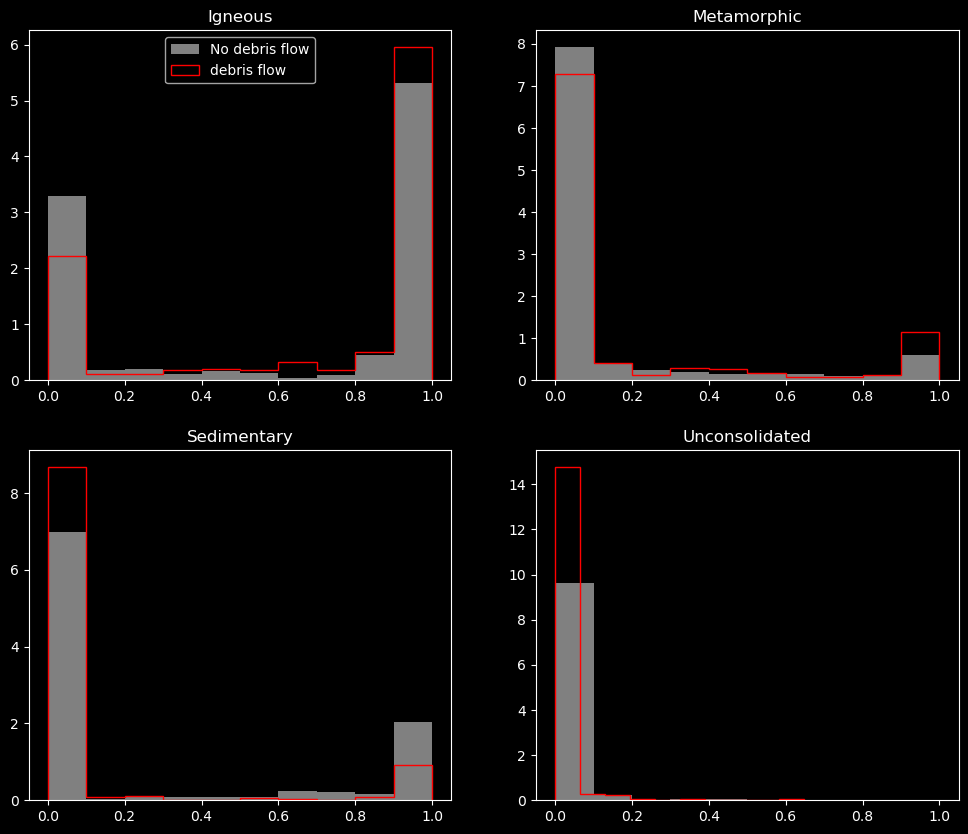

In [42]:
fig,ax=plt.subplots(figsize=(12,10), ncols=2, nrows=2)

nodebfl=mrgdata.query("response == 0")
debfl=mrgdata.query("response == 1")

rts=rttable4.columns[:-1]

usedens=True

for n,rtype in enumerate(rts):

    ax.flatten()[n].hist(nodebfl[rtype], histtype="bar", color="gray", density=usedens, label="No debris flow")
    ax.flatten()[n].hist(debfl[rtype], histtype="step", color="red", density=usedens, label="debris flow")
    if n==0:
        ax.flatten()[n].legend(loc="upper center")
    ax.flatten()[n].set_title(rtype)

Calculating debris flow likelihood by dominant rock type:

In [43]:
nodf_catcont=mrgdata.query("response == 0").groupby("domrt")["domrt"].count()
df_catcont=mrgdata.query("response == 1").groupby("domrt")["domrt"].count()

In [44]:
catcont=pd.DataFrame({"No Debris Flow": nodf_catcont, "Debris Flow": df_catcont})
catcont

,No Debris Flow,Debris Flow
domrt,,
Igneous,739,240
Metamorphic,132,56
Sedimentary,338,37
Unconsolidated,7,1


In [45]:
catcont / catcont.sum(axis=0)

,No Debris Flow,Debris Flow
domrt,,
Igneous,0.607730,0.718563
Metamorphic,0.108553,0.167665
Sedimentary,0.277961,0.110778
Unconsolidated,0.005757,0.002994


In [46]:
catcont["DFProb"] = catcont["Debris Flow"]/(catcont["No Debris Flow"] + catcont["Debris Flow"])
catcont

,No Debris Flow,Debris Flow,DFProb
domrt,,,
Igneous,739,240,0.245148
Metamorphic,132,56,0.297872
Sedimentary,338,37,0.098667
Unconsolidated,7,1,0.125000


In [47]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')

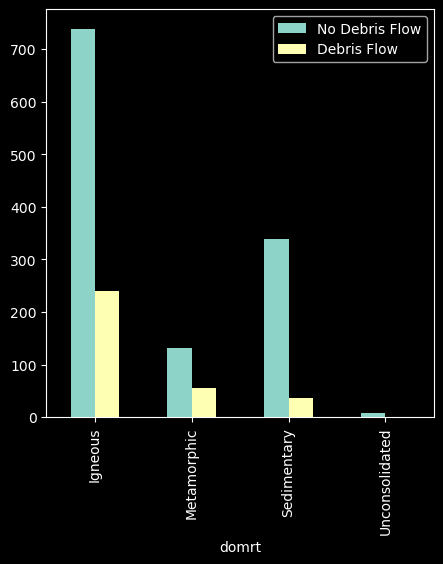

In [49]:
fig2,ax2=plt.subplots(figsize=(5,6))
fig2.subplots_adjust(bottom=0.2)
catcont[["No Debris Flow","Debris Flow"]].plot(kind="bar", ax=ax2)
fig2.savefig("../../images/rocktype_frequency.png", dpi=300)

In [50]:
mrgdata.columns

Index(['fire_name', 'year', 'fire_id', 'fire_segid', 'database', 'state',
       'response', 'stormdate', 'gaugedist_m', 'stormstart', 'stormend',
       'stormdur_h', 'stormaccum_mm', 'stormavgi_mmh', 'peak_i15_mmh',
       'peak_i30_mmh', 'peak_i60_mmh', 'contributingarea_km2', 'prophm23',
       'dnbr1000', 'kf', 'acc015_mm', 'acc030_mm', 'acc060_mm', 'geom', 'lon',
       'lat', 'SiteID', 'NB', 'GR', 'GS', 'SH', 'TU', 'TL', 'dom',
       'Fine fuel load', 'SAV', 'Packing ratio', 'Extinction moisture content',
       'Igneous', 'Metamorphic', 'Sedimentary', 'Unconsolidated', 'domrt'],
      dtype='object')

In [51]:
mrgdata.to_parquet("../../data/staley16_observations_catchment_fuelpars_rocktype_v3.parquet")

Creating a dataframe which contains both the catchment and dominant rock type, along site coordinates:

In [52]:
sitelocs=modelIFo[["lon","lat","SiteID","contributingarea_km2"]].drop_duplicates().set_index("SiteID", drop=True)

In [53]:
plottab=modelIF.join(sitelocs).join(rttable4).to_crs('epsg:4326')

Rename column `domrt`:

In [54]:
cols=plottab.columns.to_list()
cols.remove("domrt")
cols.append("Dominant Rock Type")
plottab.columns=cols

In [55]:
#how to simplify a shapely geometry
#plottab.loc[700,"geometry"].simplify(0.00025)

In [56]:
tol=0.00025
plottab["geometry_simple"]=plottab["geometry"].map(lambda x: x.simplify(tol))

In [57]:
center={"lon": plottab["geometry"].centroid.x.median(),
        "lat": plottab["geometry"].centroid.y.median()}

/tmp/ipykernel_47/3490036931.py:1: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_47/3490036931.py:2: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [58]:
plottab["Legend"] = "DF Site"
plottab["size"] = 10

In [59]:
fig1=px.choropleth_mapbox(plottab, plottab["geometry_simple"],
                     locations=plottab.index,
                     color="Dominant Rock Type",
                     #color="snapdist",
                     hover_data=["Igneous","Metamorphic","Sedimentary","Unconsolidated"],
                     center=center,
                     mapbox_style="stamen-terrain",
                     height=800,
                     zoom=4,
                     opacity=0.5)

fig2=px.scatter_mapbox(plottab.reset_index(), lon="lon", lat="lat", color="Legend", 
                      color_discrete_map={"DF Site": "orange"},
                      size="size", size_max=5,
                      hover_data=["SiteID", "contributingarea_km2", "newarea","snapdist"])

fig1.add_traces(fig2.data)

fig1

In [60]:
fig1.write_html("../../images/staley16_rock_type_mod.html")